<a href="https://colab.research.google.com/github/miqi4/PCVK_2026/blob/main/week3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

PRAKTIKUM D1

Transformasi Linier Brightness
Masukkan nilai kecerahan: 30


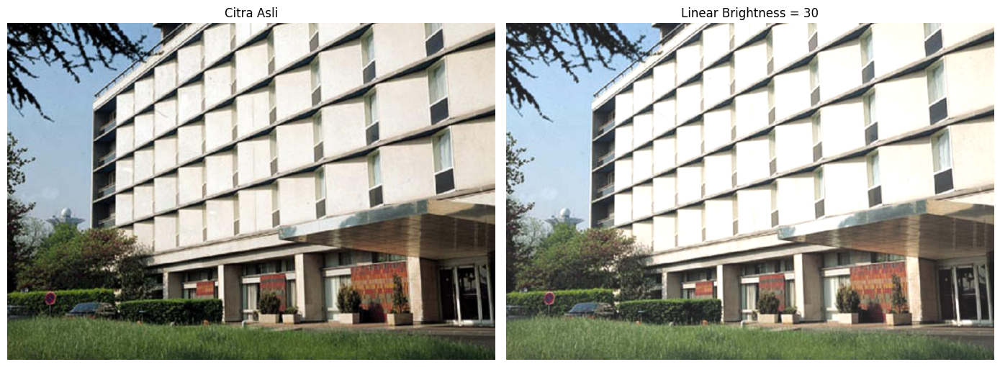

In [23]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

print('Transformasi Linier Brightness')
# Input nilai brightness
try:
    brightness = int(input('Masukkan nilai kecerahan: '))
except ValueError:
    print('Error, masukkan angka!')
    brightness = 0
url = 'https://raw.githubusercontent.com/opencv/opencv/master/samples/data/building.jpg'

resp = urllib.request.urlopen(url)
image = np.asarray(bytearray(resp.read()), dtype="uint8")

original = cv.imdecode(image, cv.IMREAD_COLOR)
# Proses Linear Brightness
# g(x,y) = f(x,y) + b
brightness_image = original.copy()

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):

            brightness_image[y, x, c] = np.clip(
                int(original[y, x, c]) + brightness,
                0,
                255
            )

# Convert BGR ke RGB
original_rgb = cv.cvtColor(original, cv.COLOR_BGR2RGB)
brightness_rgb = cv.cvtColor(brightness_image, cv.COLOR_BGR2RGB)

# Menampilkan hasil
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(original_rgb)
plt.title('Citra Asli')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(brightness_rgb)
plt.title('Linear Brightness = ' + str(brightness))
plt.axis('off')

plt.tight_layout()
plt.show()

TUGAS PRAKTIKUM 1

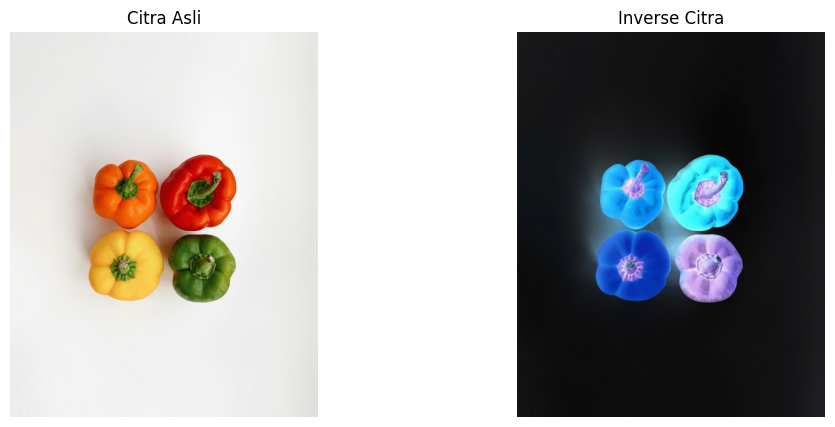

In [1]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import urllib.request

# Mengambil gambar dari internet
url = "https://images.unsplash.com/photo-1563565375-f3fdfdbefa83"
urllib.request.urlretrieve(url, "peppers.jpg")

# Membaca citra
original = cv.imread("peppers.jpg")
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Membuat citra hasil inverse
inverse = np.zeros(original.shape, dtype=np.uint8)

# Proses inverse
for i in range(original.shape[0]):
    for j in range(original.shape[1]):
        for k in range(original.shape[2]):
            inverse[i, j, k] = 255 - original[i, j, k]

# Menampilkan hasil
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(original)
plt.title("Citra Asli")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(inverse)
plt.title("Inverse Citra")
plt.axis("off")

plt.show()

TUGAS PRAKTIKUM 2

 Mengubah kontras dan tingkat kecerahan citra 
-----------------------------------------------
Masukkan tingkat kecerahan : 10
Masukkan kontras : 10


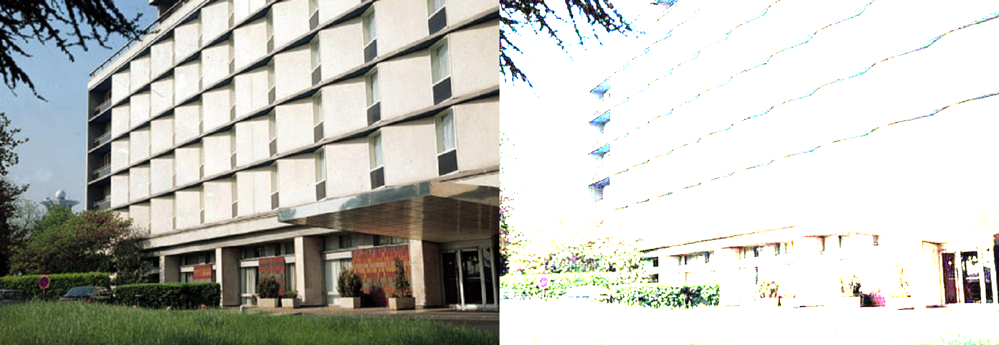

In [22]:
import cv2 as cv
import numpy as np
import urllib.request
from google.colab.patches import cv2_imshow

print(' Mengubah kontras dan tingkat kecerahan citra ')
print('-----------------------------------------------')
try:
    brightness = int(input('Masukkan tingkat kecerahan : '))
    contrast = float(input('Masukkan kontras : '))
except ValueError:
    print('Error, not a number')

url = 'https://raw.githubusercontent.com/opencv/opencv/master/samples/data/building.jpg'
resp = urllib.request.urlopen(url)
image_array = np.asarray(bytearray(resp.read()), dtype=np.uint8)
original = cv.imdecode(image_array, cv.IMREAD_COLOR)

contrast_image = np.zeros(original.shape, original.dtype)
for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        for c in range(original.shape[2]):
            contrast_image[y, x, c] = np.clip(contrast * original[y, x, c] + brightness, 0, 255)

final_frame = cv.hconcat((original, contrast_image))
cv2_imshow(final_frame)

TUGAS PRAKTIKUM 3

Mengubah tingkat kecerahan citra dengan Transformasi Log
--------------------------------------------------------
Masukkan nilai kecerahan: 30


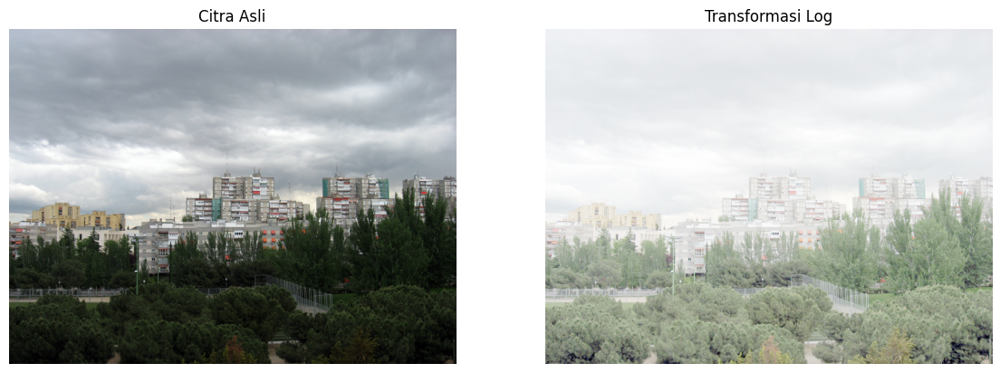

In [6]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import urllib.request
# Mengambil gambar
url = "https://live.staticflickr.com/4076/4747698456_5b6bc43400_o.jpg"
urllib.request.urlretrieve(url, "city.jpg")

# Membaca citra
original = cv.imread("city.jpg")
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

print("Mengubah tingkat kecerahan citra dengan Transformasi Log")
print("--------------------------------------------------------")

kecerahan = int(input("Masukkan nilai kecerahan: "))
# Transformasi Log
# Rumus:
# s = c * log(1 + r)
# Mengubah citra menjadi float
img = original.astype(np.float64)
# Konstanta berdasarkan nilai kecerahan
c = kecerahan
# Transformasi logarithmic
log_image = c * np.log(1 + img)
# Normalisasi agar berada pada rentang 0-255
log_image = cv.normalize(
    log_image,
    None,
    0,
    255,
    cv.NORM_MINMAX
)
log_image = np.uint8(log_image)
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(original)
plt.title("Citra Asli")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(log_image)
plt.title("Transformasi Log")
plt.axis("off")

plt.show()

TUGAS PRAKTIKUM 4

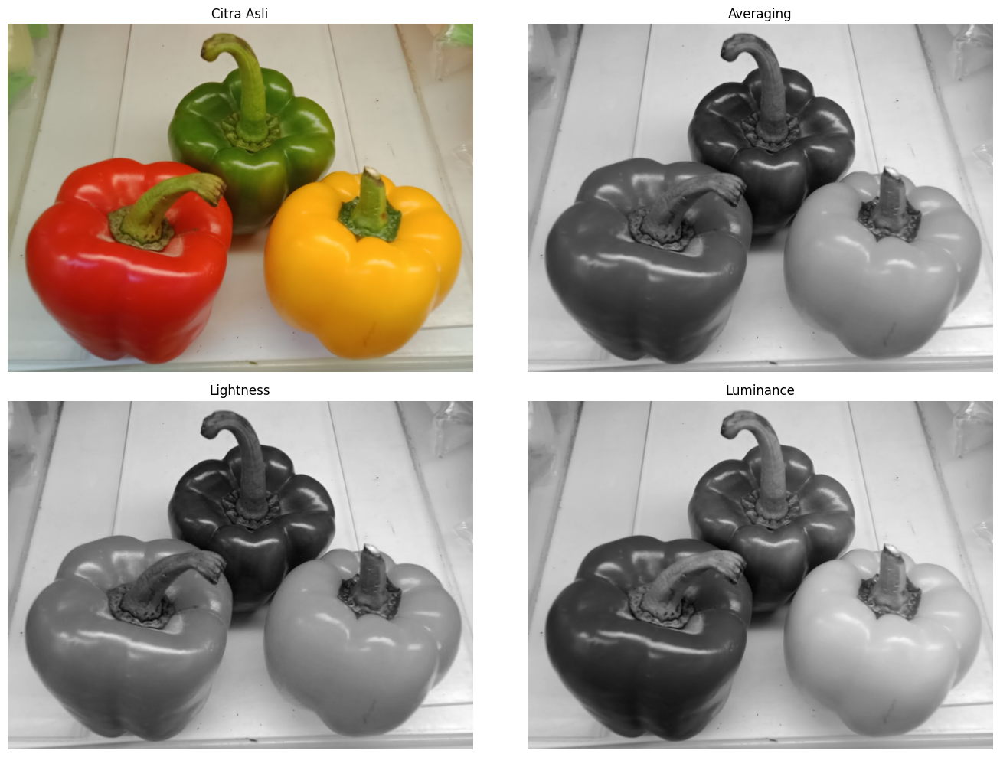

In [12]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import requests

# Download gambar
url = "https://upload.wikimedia.org/wikipedia/commons/1/10/Red%2C_Yellow%2C_and_Green_bell_peppers.jpg"

headers = {"User-Agent": "Mozilla/5.0"}
response = requests.get(url, headers=headers)

with open("peppers.jpg", "wb") as file:
    file.write(response.content)

# Baca gambar
original = cv.imread("peppers.jpg")
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

height, width = original.shape[:2]

# Membuat array hasil
gray_averaging = np.zeros((height, width), dtype=np.uint8)
gray_lightness = np.zeros((height, width), dtype=np.uint8)
gray_luminance = np.zeros((height, width), dtype=np.uint8)

# Proses grayscale
for i in range(height):
    for j in range(width):

        R = int(original[i, j, 0])
        G = int(original[i, j, 1])
        B = int(original[i, j, 2])

        # Averaging
        gray_averaging[i, j] = (R + G + B) / 3

        # Lightness
        gray_lightness[i, j] = (max(R, G, B) + min(R, G, B)) / 2

        # Luminance
        gray_luminance[i, j] = (
            0.21 * R +
            0.72 * G +
            0.07 * B
        )

# Tampilkan hasil
plt.figure(figsize=(14, 10))

plt.subplot(2, 2, 1)
plt.imshow(original)
plt.title("Citra Asli")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(gray_averaging, cmap="gray")
plt.title("Averaging")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(gray_lightness, cmap="gray")
plt.title("Lightness")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(gray_luminance, cmap="gray")
plt.title("Luminance")
plt.axis("off")

plt.tight_layout()
plt.show()

TUGAS PRAKTIKUM 5

 Menampilkan warna tertentu (merah), sisanya grayscale 
----------------------------------------------------------


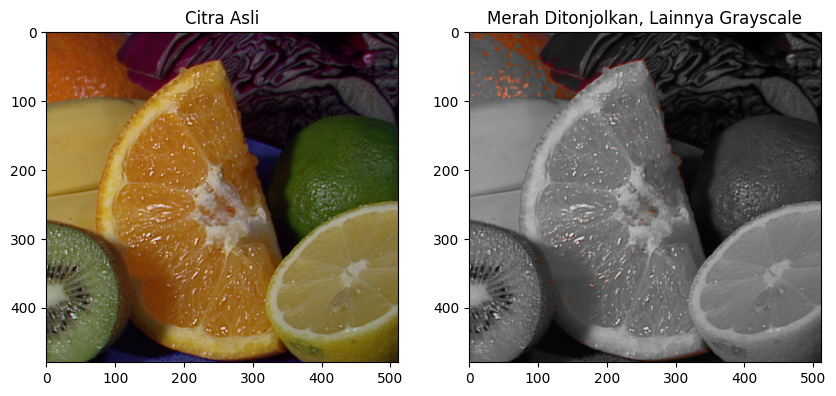

In [11]:
import cv2 as cv
import numpy as np
import urllib.request
import matplotlib.pyplot as plt

print(' Menampilkan warna tertentu (merah), sisanya grayscale ')
print('----------------------------------------------------------')

# --- Ambil gambar langsung dari URL, tidak perlu mount Drive ---
url = 'https://raw.githubusercontent.com/opencv/opencv/master/samples/data/fruits.jpg'
resp = urllib.request.urlopen(url)
image_array = np.asarray(bytearray(resp.read()), dtype=np.uint8)
original = cv.imdecode(image_array, cv.IMREAD_COLOR)  # BGR

# --- 1. Konversi ke HSV untuk mendeteksi warna merah ---
hsv = cv.cvtColor(original, cv.COLOR_BGR2HSV)

# Warna merah di HSV OpenCV terbagi di 2 rentang (hue mendekati 0 dan mendekati 180)
lower_red1 = np.array([0, 70, 50])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 70, 50])
upper_red2 = np.array([180, 255, 255])

mask1 = cv.inRange(hsv, lower_red1, upper_red1)
mask2 = cv.inRange(hsv, lower_red2, upper_red2)
red_mask = cv.bitwise_or(mask1, mask2)   # mask: 255 = merah, 0 = bukan merah

# --- 2. Buat versi grayscale dari citra asli (3 channel biar bisa digabung) ---
gray = cv.cvtColor(original, cv.COLOR_BGR2GRAY)
gray_3ch = cv.cvtColor(gray, cv.COLOR_GRAY2BGR)

# --- 3. Gabungkan: area merah tetap berwarna, area lain jadi grayscale ---
result = np.where(red_mask[:, :, None] == 255, original, gray_3ch)

# --- Tampilkan (before-after) ---
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(cv.cvtColor(original, cv.COLOR_BGR2RGB))
ax[0].set_title('Citra Asli')

ax[1].imshow(cv.cvtColor(result, cv.COLOR_BGR2RGB))
ax[1].set_title('Merah Ditonjolkan, Lainnya Grayscale')

plt.show()

TUGAS PRAKTIKUM 6

Gamma Correction pada citra
----------------------------------
Masukkan nilai Gamma: 0.4


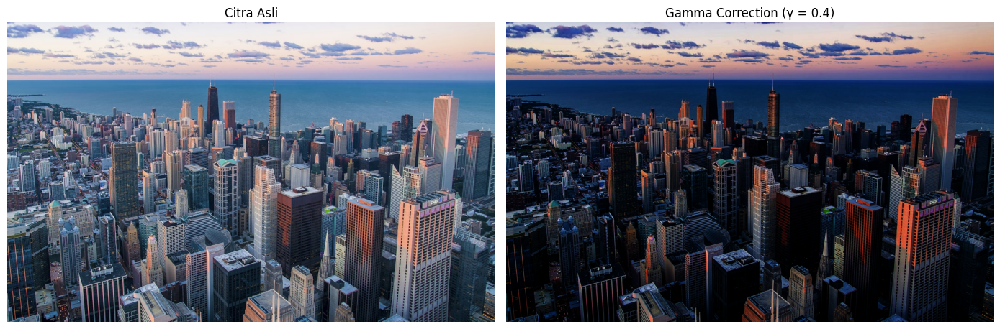

In [21]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import requests

# Download gambar
url = "https://images.unsplash.com/photo-1477959858617-67f85cf4f1df?auto=format&fit=crop&w=1200&q=80"

headers = {"User-Agent": "Mozilla/5.0"}
response = requests.get(url, headers=headers)

with open("city.jpg", "wb") as file:
    file.write(response.content)

# Baca gambar
original = cv.imread("city.jpg")
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Input Gamma
print("Gamma Correction pada citra")
print("----------------------------------")

try:
    gamma = float(input("Masukkan nilai Gamma: "))

    if gamma <= 0:
        print("Gamma harus lebih besar dari 0!")
        gamma = 3

except ValueError:
    print("Error, input harus berupa angka!")
    gamma = 3

# Gamma Correction
img = original.astype(np.float32)

gamma_image = 255 * ((img / 255) ** (1 / gamma))

gamma_image = np.clip(gamma_image, 0, 255)
gamma_image = gamma_image.astype(np.uint8)

# Tampilkan hasil
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(original)
plt.title("Citra Asli")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gamma_image)
plt.title(f"Gamma Correction (γ = {gamma})")
plt.axis("off")

plt.tight_layout()
plt.show()

TUGAS PRAKTIKUM 7

 Simulasi Image Depth 
Masukkan bit depth tujuan (1-8): 2
Bit depth awal  : 8 bit
Bit depth tujuan: 2 bit
Jumlah level    : 4


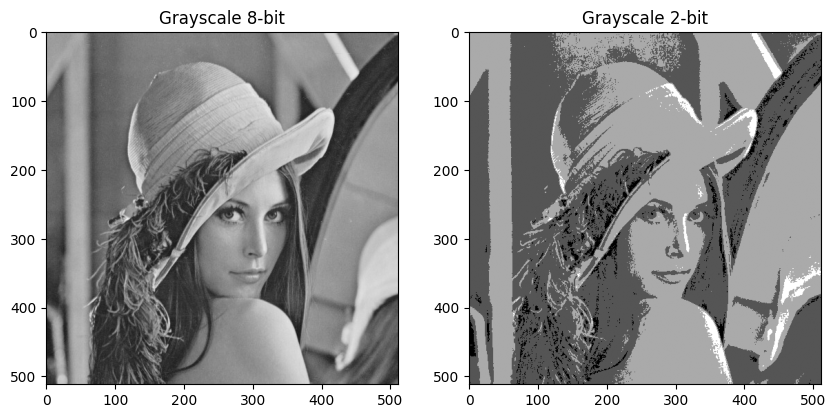

In [24]:
import cv2 as cv
import numpy as np
import urllib.request
import matplotlib.pyplot as plt
print(' Simulasi Image Depth ')
try:
    bit_depth = int(input('Masukkan bit depth tujuan (1-8): '))
except ValueError:
    print('Error, not a number')

# --- Ambil gambar langsung dari URL, tidak perlu mount Drive ---
url = 'https://raw.githubusercontent.com/opencv/opencv/master/samples/data/lena.jpg'
resp = urllib.request.urlopen(url)
image_array = np.asarray(bytearray(resp.read()), dtype=np.uint8)
original = cv.imdecode(image_array, cv.IMREAD_GRAYSCALE)

# --- Hitung level sesuai rumus ---
level = 255 / (pow(2, bit_depth) - 1)

print('Bit depth awal  : 8 bit')
print('Bit depth tujuan:', bit_depth, 'bit')
print('Jumlah level    :', pow(2, bit_depth))

# --- Implementasi rumus: C' = round((C/level) * level) ---
depth_image = np.zeros(original.shape, original.dtype)

for y in range(original.shape[0]):
    for x in range(original.shape[1]):
        depth_image[y, x] = round((original[y, x] / level)) * level

# Cara simple tanpa for loop (opsional, jauh lebih cepat):
# depth_image = (np.round(original / level) * level).astype(np.uint8)

# --- Tampilkan (before-after) ---
fig, ax = plt.subplots(1, 2, figsize=(10, 5))
ax[0].imshow(original, cmap='gray', vmin=0, vmax=255)
ax[0].set_title('Grayscale 8-bit')

ax[1].imshow(depth_image, cmap='gray', vmin=0, vmax=255)
ax[1].set_title(f'Grayscale {bit_depth}-bit')

plt.show()

TUGAS PRAKTIKUM 8

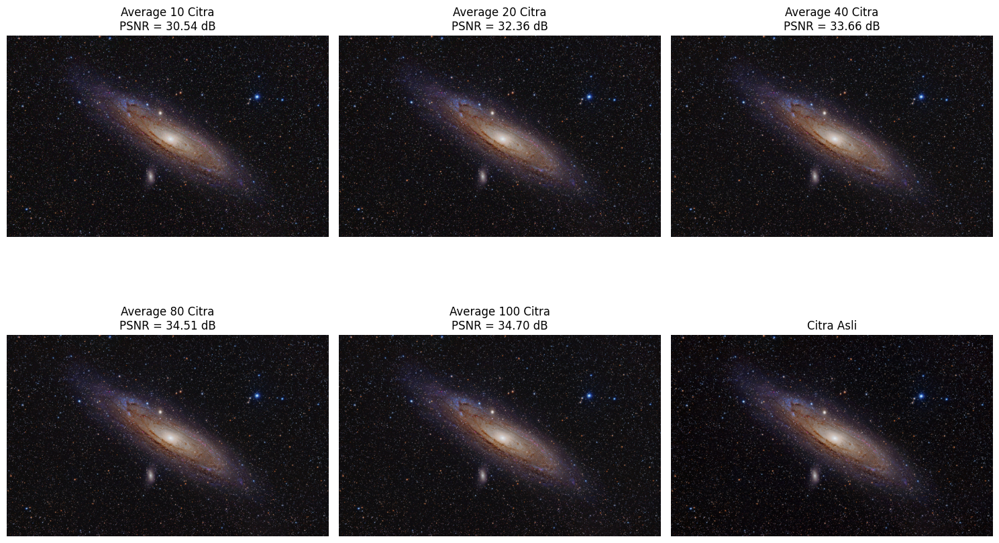


HASIL AVERAGE DENOISING
Jumlah Citra	PSNR (dB)
10		30.54
20		32.36
40		33.66
80		34.51
100		34.70


In [26]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import requests
from math import log10, sqrt

# Download gambar galaksi
url = "https://upload.wikimedia.org/wikipedia/commons/9/98/Andromeda_Galaxy_%28with_h-alpha%29.jpg"

headers = {"User-Agent": "Mozilla/5.0"}
response = requests.get(url, headers=headers)

if response.status_code != 200:
    raise Exception("Gagal download gambar")

with open("galaxy.jpg", "wb") as file:
    file.write(response.content)

# Baca gambar
original = cv.imread("galaxy.jpg")
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

# Resize agar proses lebih cepat
original = cv.resize(original, (800, 500))

# Membuat 100 citra Gaussian Noise
np.random.seed(42)

noisy_images = []

for i in range(100):
    noise = np.random.normal(0, 25, original.shape)
    noisy = original.astype(np.float32) + noise
    noisy = np.clip(noisy, 0, 255).astype(np.uint8)
    noisy_images.append(noisy)

# Fungsi PSNR
def PSNR(img1, img2):
    mse = np.mean(
        (img1.astype(float) - img2.astype(float)) ** 2
    )

    if mse == 0:
        return 100

    return 20 * log10(255.0 / sqrt(mse))

# Jumlah citra
jumlah_citra = [10, 20, 40, 80, 100]

hasil_image = []
hasil_psnr = []

# Average Denoising
for jumlah in jumlah_citra:

    average = np.mean(
        noisy_images[:jumlah],
        axis=0
    )

    average = np.clip(
        average,
        0,
        255
    ).astype(np.uint8)

    psnr = PSNR(original, average)

    hasil_image.append(average)
    hasil_psnr.append(psnr)

# Tampilkan hasil
plt.figure(figsize=(15, 10))

for i in range(5):

    plt.subplot(2, 3, i + 1)

    plt.imshow(hasil_image[i])

    plt.title(
        f"Average {jumlah_citra[i]} Citra\n"
        f"PSNR = {hasil_psnr[i]:.2f} dB"
    )

    plt.axis("off")

plt.subplot(2, 3, 6)
plt.imshow(original)
plt.title("Citra Asli")
plt.axis("off")

plt.tight_layout()
plt.show()

# Tabel PSNR
print("\nHASIL AVERAGE DENOISING")
print("Jumlah Citra\tPSNR (dB)")

for jumlah, psnr in zip(jumlah_citra, hasil_psnr):
    print(f"{jumlah}\t\t{psnr:.2f}")

TUGAS PRAKTIKUM 9

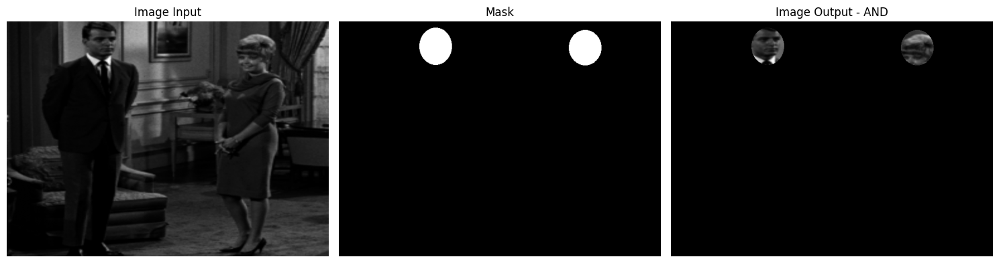

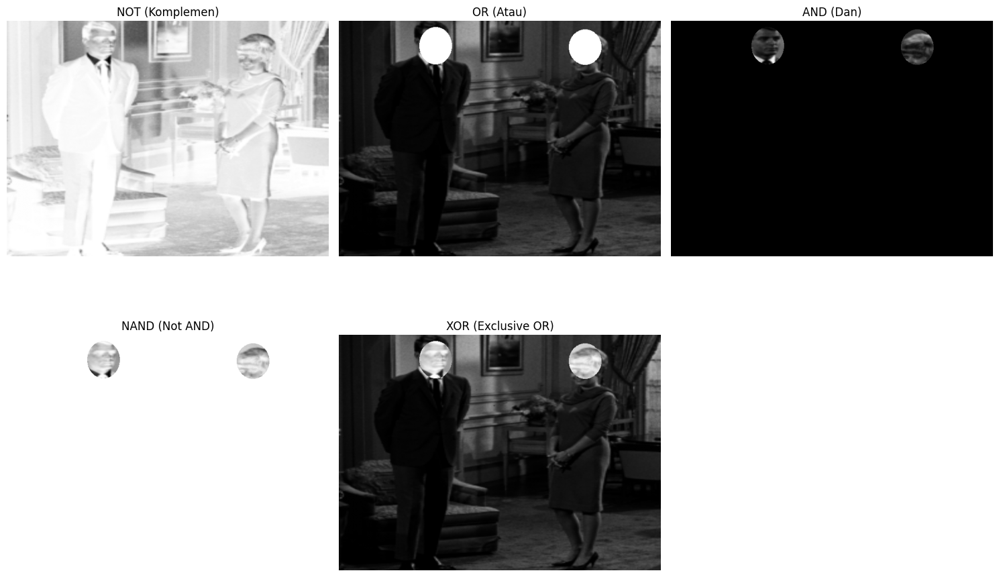

In [18]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import requests

url = "https://github.com/fabianseiler/Ax-Image-Processing/raw/refs/heads/main/image%20grayscale/couple.tiff.tiff"

response = requests.get(url)
image_array = np.frombuffer(response.content, np.uint8)

original = cv.imdecode(image_array, cv.IMREAD_GRAYSCALE)

if original is None:
    raise ValueError("Gambar gagal dibaca!")

# Ukuran gambar
original = cv.resize(original, (700, 512))

h, w = original.shape

# MEMBUAT MASK

mask = np.zeros((h, w), dtype=np.uint8)

# Kepala pria
cv.ellipse(
    mask,
    (210, 55),       # posisi kepala pria
    (35, 40),        # ukuran mask
    0, 0, 360,
    255,
    -1
)

# Kepala wanita
cv.ellipse(
    mask,
    (535, 58),       # posisi kepala wanita
    (35, 38),        # ukuran mask
    0, 0, 360,
    255,
    -1
)
# NOT
not_result = cv.bitwise_not(original)

# OR
or_result = cv.bitwise_or(original, mask)

# AND
and_result = cv.bitwise_and(original, mask)

# NAND
nand_result = cv.bitwise_not(and_result)

# XOR
xor_result = cv.bitwise_xor(original, mask)
# 4. TAMPILAN UTAMA

plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(original, cmap="gray")
plt.title("Image Input")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mask, cmap="gray")
plt.title("Mask")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(and_result, cmap="gray")
plt.title("Image Output - AND")
plt.axis("off")

plt.tight_layout()
plt.show()

hasil = [
    ("NOT (Komplemen)", not_result),
    ("OR (Atau)", or_result),
    ("AND (Dan)", and_result),
    ("NAND (Not AND)", nand_result),
    ("XOR (Exclusive OR)", xor_result)
]

plt.figure(figsize=(15, 10))

for i, (nama, output) in enumerate(hasil):

    plt.subplot(2, 3, i + 1)
    plt.imshow(output, cmap="gray")
    plt.title(nama)
    plt.axis("off")

plt.tight_layout()
plt.show()

TUGAS PRAKTIKUM 10

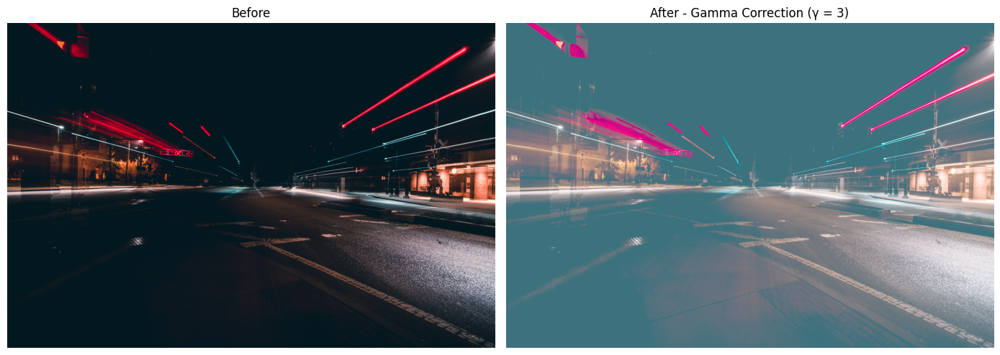

In [40]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import requests

url = "https://commons.wikimedia.org/wiki/Special:Redirect/file/Night_road_in_long_exposure_(Unsplash).jpg"

response = requests.get(url, headers={"User-Agent": "Mozilla/5.0"})

if response.status_code != 200:
    print("Gagal mengambil gambar:", response.status_code)
else:
    with open("night.jpg", "wb") as file:
        file.write(response.content)

original = cv.imread("night.jpg")

if original is None:
    print("Gambar gagal dibaca")
else:
    original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

    gamma = 3

    img = original.astype(np.float32)
    result = 255 * ((img / 255) ** (1 / gamma))
    result = np.clip(result, 0, 255).astype(np.uint8)

    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Before")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.title(f"After - Gamma Correction (γ = {gamma})")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

TUGAS PRAKTIKUM 11

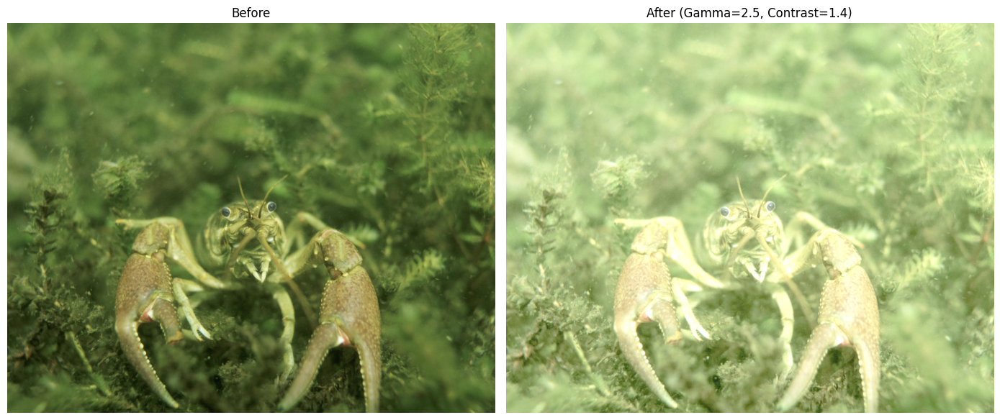

In [35]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import requests

url = "https://commons.wikimedia.org/wiki/Special:Redirect/file/Crayfish_close_up_underwater.jpg"

response = requests.get(url, headers={"User-Agent": "Mozilla/5.0"})
with open("crayfish.jpg", "wb") as file:
    file.write(response.content)

original = cv.imread("crayfish.jpg")

if original is None:
    print("Gambar gagal dibaca")
else:
    original = cv.cvtColor(original, cv.COLOR_BGR2RGB)

    gamma = 2.5
    contrast = 1.4

    img = original.astype(np.float32)

    gamma_img = 255 * ((img / 255) ** (1 / gamma))
    gamma_img = np.clip(gamma_img, 0, 255)

    result = contrast * (gamma_img - 128) + 128
    result = np.clip(result, 0, 255).astype(np.uint8)

    plt.figure(figsize=(14, 6))

    plt.subplot(1, 2, 1)
    plt.imshow(original)
    plt.title("Before")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    plt.imshow(result)
    plt.title(f"After (Gamma={gamma}, Contrast={contrast})")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

Metode: Gamma Correction dan Contrast.
Alasan: Citra crayfish terlihat gelap dan kurang jelas, sehingga perlu dicerahkan dan ditingkatkan kontrasnya.
Parameter: Gamma = 2.5, Contrast = 1.4.
Hasil: Crayfish menjadi lebih terang dan detailnya lebih mudah terlihat.
Risiko: Parameter terlalu tinggi dapat membuat gambar terlalu terang dan menghilangkan detail pada area terang.